# 16-14. 프로젝트 : SRGAN 활용하기

아래와 같은 프로젝트들을 진행해보도록 하겠습니다. 

## 프로젝트 1 : 직접 고른 이미지로 SRGAN 실험하기

### 프로젝트 1-1  고해상도 이미지 복원후 비교 


1. (적당히) 높은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.

2. 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 1/4로 줄입니다. cv2.resize()를 사용해 봅시다.

3. 줄인 저해상도 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.

4. 2.의 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. 마찬가지로 cv2.resize()를 사용해 봅시다.

5. 3개 이미지(4.의 Bicubic의 결과, 3.의 SRGAN의 결과, 1.의 원래 고해상도 이미지)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.

6. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)

### 프로젝트 1-2 저해상도 이미지 고해상도화

1. (적당히) 낮은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.

2. 불러온 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.
3. 1.에서 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. cv2.resize()를 사용해 봅시다.

4. 2개 이미지(3.의 Bicubic의 결과, 2.의 SRGAN의 결과)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.

5. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)

## 프로젝트 2 : SRGAN을 이용해 고해상도 gif 생성하기

1. gif 이미지 불러오기  

2. 프레임별로 Super Resolution 진행하기

3. 프레임을 합쳐 gif 마늗ㄹ기 

4. jupyter notebook에 gif 표시하기

## 루브릭

아래의 기준을 바탕으로 프로젝트를 평가합니다.

|평가문항|상세기준|
|:-------|:---------|
|SRGAN을 이용해 고해상도의 이미지를 생성하였다.|SRGAN을 통해 생성된 이미지를 제출하였다.|
|다양한 해상도의 이미지에 대해 시각화를 통해 원본, SRGAN생성본, interpolation생성본을 비교분석하였다.|이미지의 특성과 super resolution 방법을 관련지어 생성 결과를 체계적으로 분석하였다.|
|저해상도 gif 동영상을 고해상도 동영상으로 성공적으로 변환하였다.|저해상도 원본 gif와 생성된 고해상도 gif의 해상도 차이가 시각적으로 확인 가능하다.|


# 들어가기 전에

In [1]:
# 들어가기 전에 library 불러오기 
import cv2
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras import Input, Model
from tensorflow.keras import layers,Sequential
from tensorflow.python.keras import applications
from tensorflow.keras import losses, metrics, optimizers
import tensorflow_datasets as tfds
import os
import numpy as np

## SRGAN 모델 만들기

In [2]:
train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)
def preprocessing(lr, hr):
    hr = tf.cast(hr, tf.float32) /255.
        
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr_patch = tf.image.random_crop(hr, size=[96,96,3])
        
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄입니다
    # 이렇게 만든 저해상도 이미지를 SRGAN의 입력으로 사용합니다.
    lr_patch = tf.image.resize(hr_patch, [96//4, 96//4], "bicubic")
    return lr_patch, hr_patch

train = train.map(preprocessing).shuffle(buffer_size=10).repeat().batch(8)
valid = valid.map(preprocessing).repeat().batch(8)
print("✅")


✅


In [3]:

# 그림의 파란색 블록을 정의합니다.
def gene_base_block(x):
    out = layers.Conv2D(64, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.PReLU(shared_axes=[1,2])(out)
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.Add()([x, out])

# 그림의 뒤쪽 연두색 블록을 정의합니다.
def upsample_block(x):
    out = layers.Conv2D(256, 3, 1, "same")(x)
    # 그림의 PixelShuffler 라고 쓰여진 부분을 아래와 같이 구현합니다.
    out = layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(out)
    return layers.PReLU(shared_axes=[1,2])(out)
    
# 전체 Generator를 정의합니다.
def get_generator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 9, 1, "same")(inputs)
    out = residual = layers.PReLU(shared_axes=[1,2])(out)
    
    for _ in range(5):
        out = gene_base_block(out)
    
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.Add()([residual, out])
    
    for _ in range(2):
        out = upsample_block(out)
        
    out = layers.Conv2D(3, 9, 1, "same", activation="tanh")(out)
    return Model(inputs, out)

print("✅")



✅


In [4]:
# 그림의 파란색 블록을 정의합니다.
def disc_base_block(x, n_filters=128):
    out = layers.Conv2D(n_filters, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(n_filters, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.LeakyReLU()(out)

# 전체 Discriminator 정의합니다.
def get_discriminator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 3, 1, "same")(inputs)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(64, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    
    for n_filters in [128, 256, 512]:
        out = disc_base_block(out, n_filters)
    
    out = layers.Dense(1024)(out)
    out = layers.LeakyReLU()(out)
    out = layers.Dense(1, activation="sigmoid")(out)
    return Model(inputs, out)

print("✅")


✅


In [5]:
def get_feature_extractor(input_shape=(None, None, 3)):
    vgg = applications.vgg19.VGG19(
        include_top=False, 
        weights="imagenet", 
        input_shape=input_shape
    )
    # 아래 vgg.layers[20]은 vgg 내의 마지막 convolutional layer 입니다.
    return Model(vgg.input, vgg.layers[20].output)

print("✅")

✅


In [6]:
generator = get_generator()
discriminator = get_discriminator()
vgg = get_feature_extractor()

# 사용할 loss function 및 optimizer 를 정의합니다.
bce = losses.BinaryCrossentropy(from_logits=False)
mse = losses.MeanSquaredError()
gene_opt = optimizers.Adam()
disc_opt = optimizers.Adam()

def get_gene_loss(fake_out):
    return bce(tf.ones_like(fake_out), fake_out)

def get_disc_loss(real_out, fake_out):
    return bce(tf.ones_like(real_out), real_out) + bce(tf.zeros_like(fake_out), fake_out)


@tf.function
def get_content_loss(hr_real, hr_fake):
    hr_real = applications.vgg19.preprocess_input(hr_real)
    hr_fake = applications.vgg19.preprocess_input(hr_fake)
    
    hr_real_feature = vgg(hr_real) / 12.75
    hr_fake_feature = vgg(hr_fake) / 12.75
    return mse(hr_real_feature, hr_fake_feature)


@tf.function
def step(lr, hr_real):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        hr_fake = generator(lr, training=True)
        
        real_out = discriminator(hr_real, training=True)
        fake_out = discriminator(hr_fake, training=True)
        
        perceptual_loss = get_content_loss(hr_real, hr_fake) + 1e-3 * get_gene_loss(fake_out)
        discriminator_loss = get_disc_loss(real_out, fake_out)
        
    gene_gradient = gene_tape.gradient(perceptual_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(discriminator_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return perceptual_loss, discriminator_loss


gene_losses = metrics.Mean()
disc_losses = metrics.Mean()

In [7]:
for epoch in range(1, 2):
    for i, (lr, hr) in enumerate(train):
        g_loss, d_loss = step(lr, hr)
        
        gene_losses.update_state(g_loss)
        disc_losses.update_state(d_loss)
        
        # 10회 반복마다 loss를 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \nGenerator_loss:{gene_losses.result():.4f} \nDiscriminator_loss:{disc_losses.result():.4f}", end="\n\n")
        
        if (i+1) == 21:
            break
            
    gene_losses.reset_states()
    disc_losses.reset_states()

EPOCH[1] - STEP[10] 
Generator_loss:0.0014 
Discriminator_loss:2.1667

EPOCH[1] - STEP[20] 
Generator_loss:0.0013 
Discriminator_loss:1.5219



## 학습된 모델 불러오기 

In [7]:
model_file = os.getenv('HOME')+'/aiffel/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

In [8]:
def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]


In [9]:
train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)

for i, (lr, hr) in enumerate(valid):
    if i == 6: break

srgan_hr = apply_srgan(lr)
print("✅")

✅


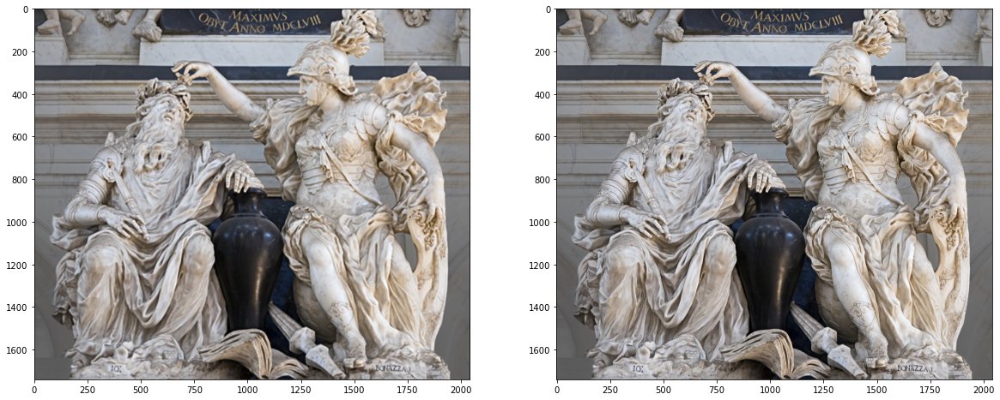

In [74]:
# 시각화를 위해 한 개의 데이터만 선택 

for i, (lr, hr) in enumerate(valid):
    if i == 6: break
        
# 저해상도 이미지를 고해상도 이미지 크기로 bicubic interpolation 함.

hr, lr = np.array(hr), np.array(lr)
bicubic_hr = cv2.resize(
    lr,
    dsize = (hr.shape[1], hr.shape[0]),  # 고해상도 이미지 크기로 설정, 가로 세로 순서
    interpolation = cv2.INTER_CUBIC # bicubic 설정
)

# 저해상도 및 고해상도 이미지를 시각화해보기

plt.figure(figsize = (20,10))
plt.subplot(1,2,1); plt.imshow(bicubic_hr)
plt.subplot(1,2,2); plt.imshow(hr)

Text(0.5, 1.0, 'HR')

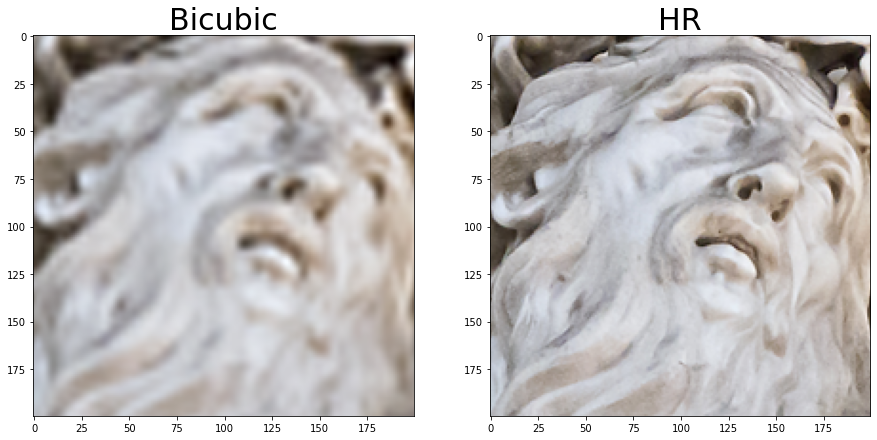

In [75]:
# 이미지의 특정 부분을 잘라내는 함수를 정의합니다.

def crop(image, left_top, x = 200, y = 200):
    return image[left_top[0]:(left_top[0]+ x), left_top[1]:(left_top[1]+ y), :]

# interpolation 된 이미지와 고해상도 이미지의 동일한 부분을 각각 잘라냅니다.
left_top = (400, 500)
crop_bicubic_hr = crop(bicubic_hr, left_top)
crop_hr = crop(hr, left_top)

# 잘라낸 부분 시각화
plt.figure(figsize = (15,25))
plt.subplot(1,2,1); plt.imshow(crop_bicubic_hr); plt.title("Bicubic", fontsize = 30)
plt.subplot(1,2,2); plt.imshow(crop_hr); plt.title("HR", fontsize = 30)

Text(0.5, 1.0, 'HR')

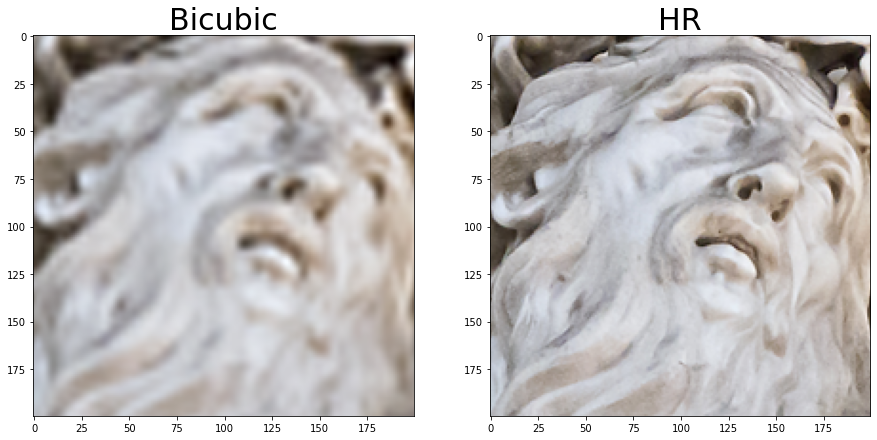

In [76]:
# 이미지의 특정 부분을 잘라내는 함수를 정의합니다.

def crop(image, left_top, x = 200, y = 200):
    return image[left_top[0]:(left_top[0]+ x), left_top[1]:(left_top[1]+ y), :]

# interpolation 된 이미지와 고해상도 이미지의 동일한 부분을 각각 잘라냅니다.
left_top = (400, 500)
crop_bicubic_hr = crop(bicubic_hr, left_top)
crop_hr = crop(hr, left_top)

# 잘라낸 부분 시각화
plt.figure(figsize = (15,25))
plt.subplot(1,2,1); plt.imshow(crop_bicubic_hr); plt.title("Bicubic", fontsize = 30)
plt.subplot(1,2,2); plt.imshow(crop_hr); plt.title("HR", fontsize = 30)

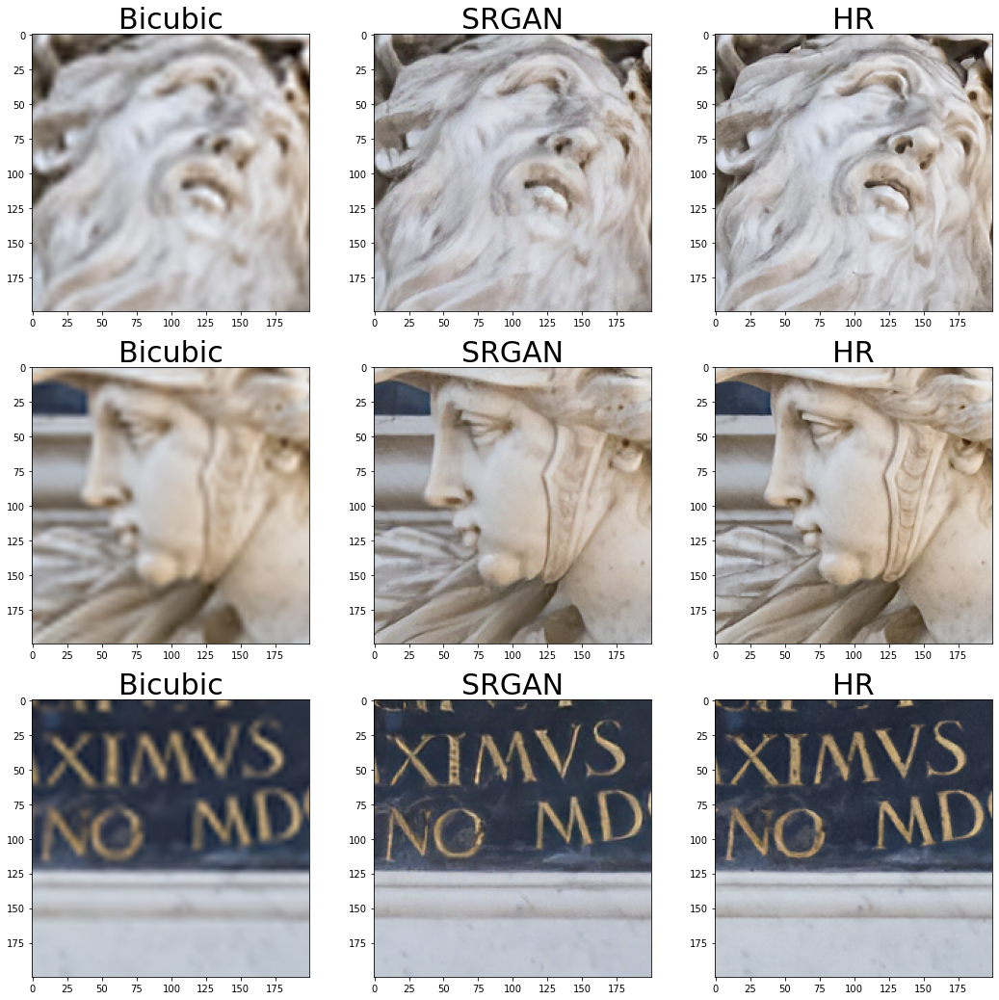

In [77]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srgan_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

# 프로젝트 1-1 고해상도 이미지 복원후 비교


### step  1: 이미지 선택
아래의 이미지를 선택하였습니다. 

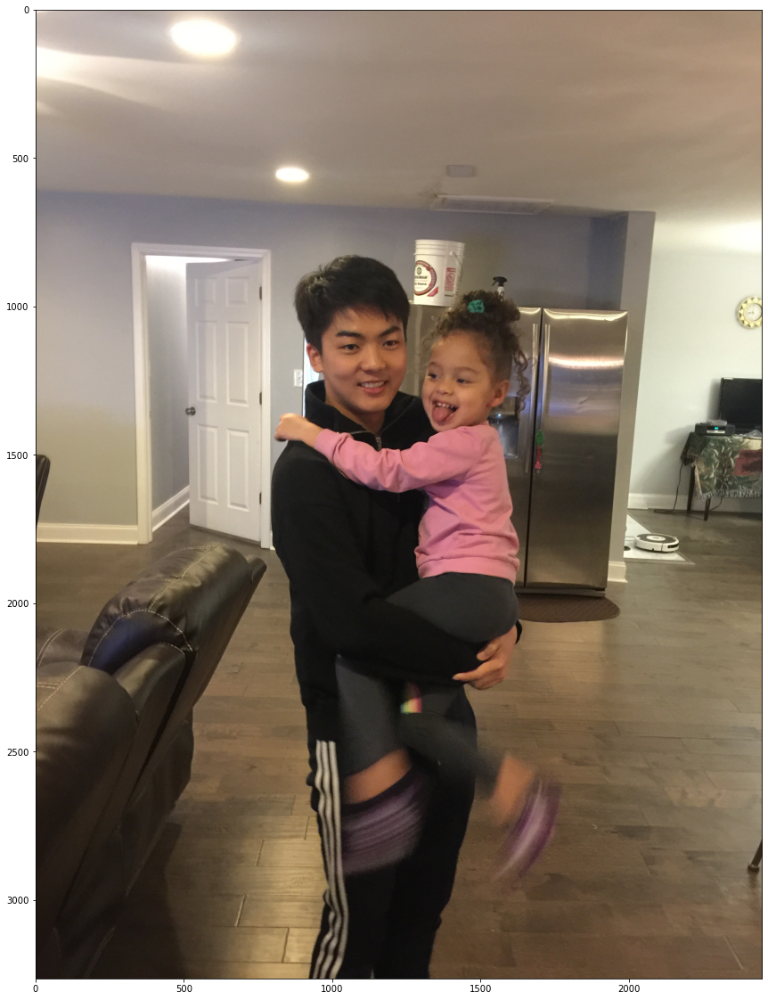

(3264, 2448, 3)

In [19]:
p1_path = './IMG_1994.JPG'  # 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요. 
p1_orig = cv2.imread(p1_path) 
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(p1_orig, cv2.COLOR_BGR2RGB))
plt.show()
p1_orig.shape

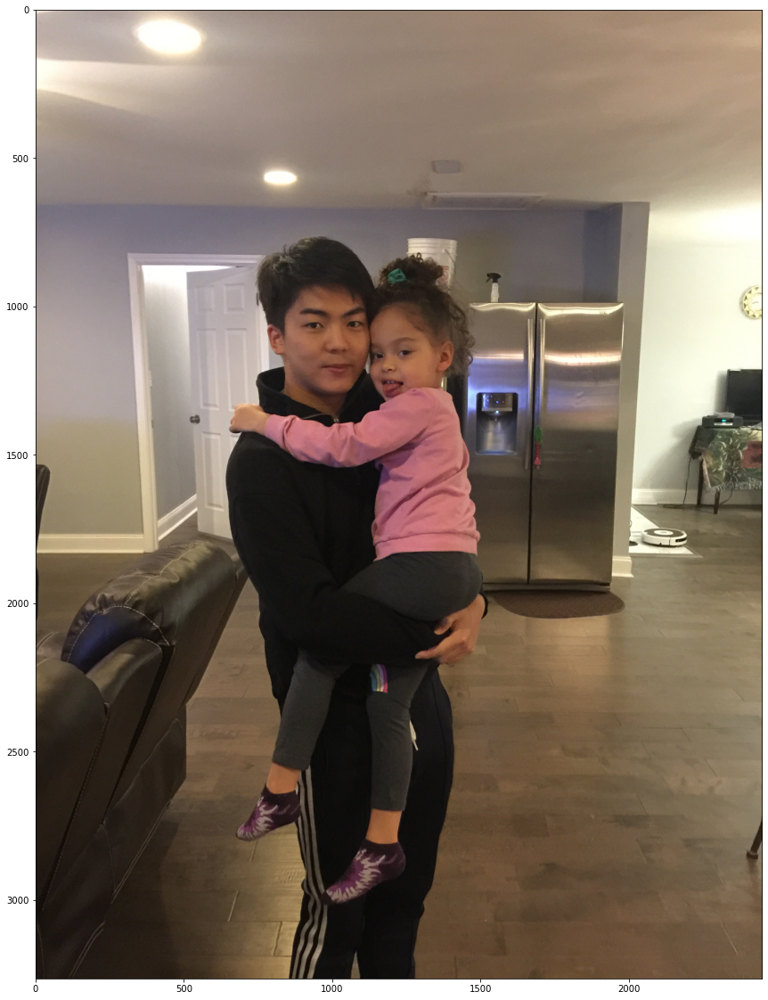

(3264, 2448, 3)

In [9]:
p1_path2 = './IMG_1992.JPG'  # 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요. 
p1_orig2 = cv2.imread(p1_path2) 
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(p1_orig2, cv2.COLOR_BGR2RGB))
plt.show()
p1_orig2.shape

### step 2: 1/4 크기로 resize 

(816, 612, 3)


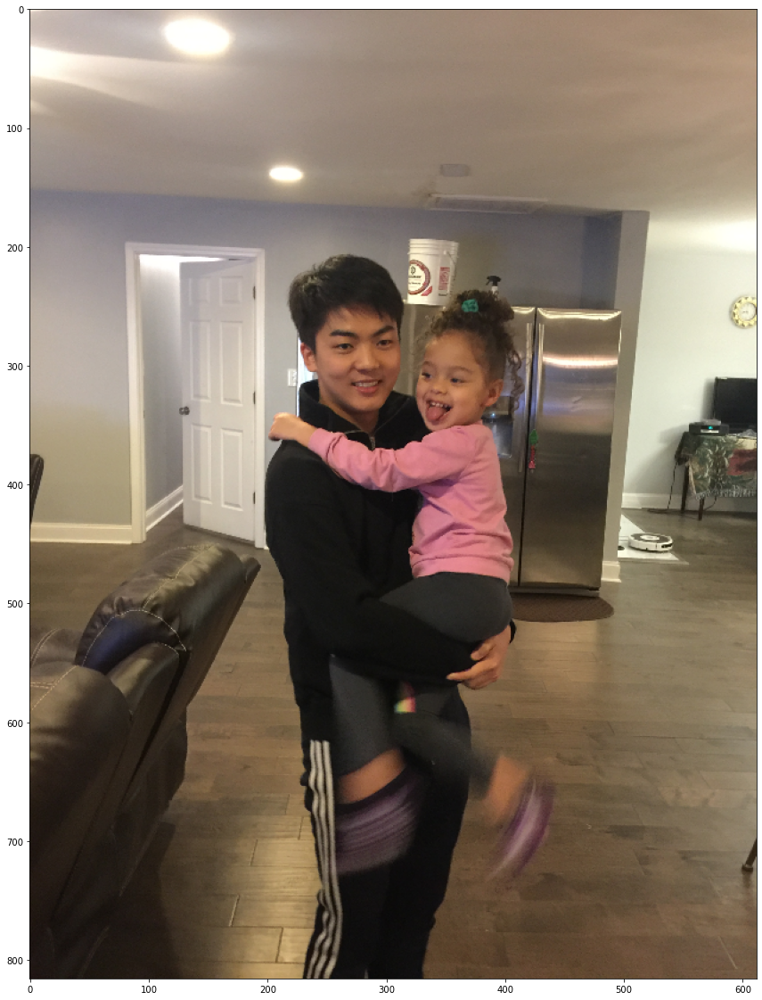

In [20]:
p1_ls = cv2.resize(p1_orig, dsize = (p1_orig.shape[1]//4,p1_orig.shape[0]//4))
print(p1_ls.shape)

plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(p1_ls,cv2.COLOR_BGR2RGB) ) 

(816, 612, 3)


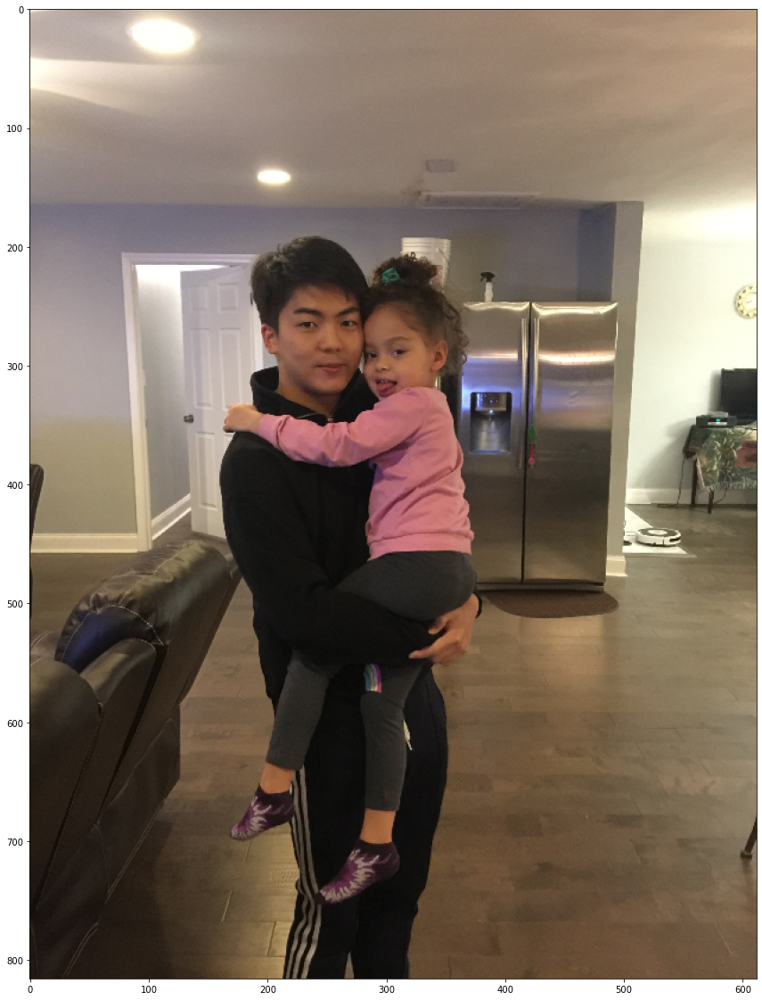

In [10]:
p1_ls2 = cv2.resize(p1_orig2, dsize = (p1_orig2.shape[1]//4,p1_orig2.shape[0]//4))
print(p1_ls2.shape)

plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(p1_ls2,cv2.COLOR_BGR2RGB) ) 

### step3 SRGAN으로 Super Resolution

In [67]:
p1_srgan = apply_srgan(p1_ls)

(3264, 2448, 3)

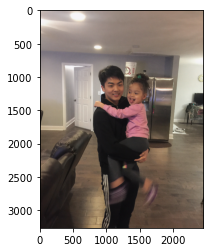

In [68]:
plt.imshow(cv2.cvtColor(p1_srgan,cv2.COLOR_BGR2RGB) ) 
p1_srgan.shape

In [11]:
p1_srgan2 = apply_srgan(p1_ls2)

(3264, 2448, 3)

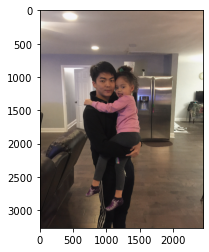

In [12]:
plt.imshow(cv2.cvtColor(p1_srgan2,cv2.COLOR_BGR2RGB) ) 
p1_srgan2.shape

### step 4  bicubic interpolation으로 Super Resolution

(3264, 2448, 3)


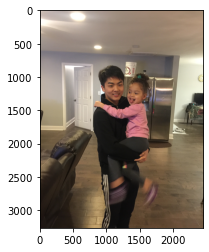

In [49]:
p1_bicubic = cv2.resize(p1_orig, dsize = (p1_orig.shape[1], p1_orig.shape[0]), interpolation = cv2.INTER_CUBIC)
print(p1_bicubic.shape)
plt.imshow(cv2.cvtColor(p1_bicubic,cv2.COLOR_BGR2RGB ))

(3264, 2448, 3)


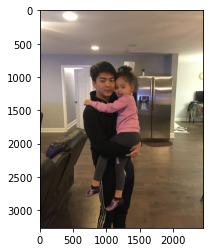

In [14]:
p1_bicubic2 = cv2.resize(p1_orig2, dsize = (p1_orig2.shape[1], p1_orig2.shape[0]), interpolation = cv2.INTER_CUBIC)
print(p1_bicubic2.shape)
plt.imshow(cv2.cvtColor(p1_bicubic2,cv2.COLOR_BGR2RGB ))

### step 5 3개 이미지 비교 

In [15]:
def crop(image, left_top, x = 50, y =100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1] + y), :]


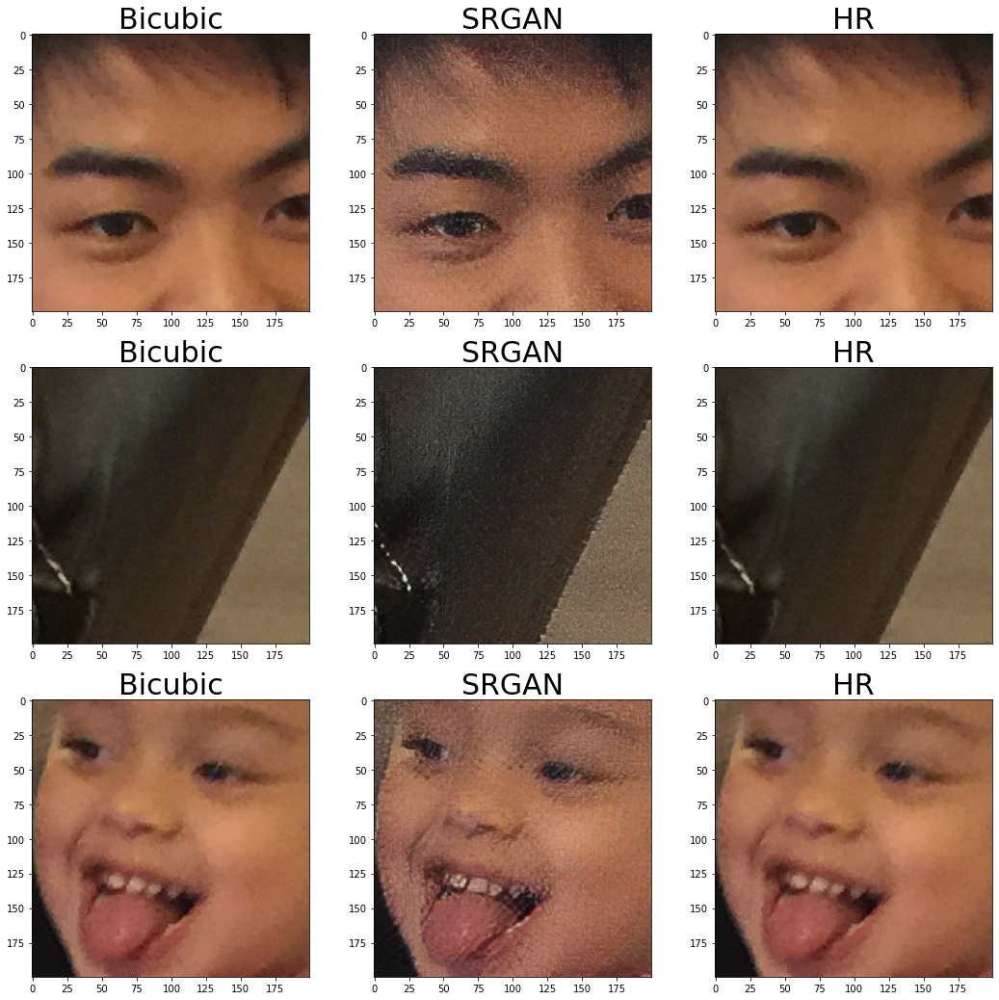

In [69]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(1000,1000), (2000,500), (1200,1300)]

images = []
for left_top in left_tops:
    img1 = crop(p1_bicubic, left_top, 200, 200)
    img2 = crop(p1_srgan , left_top, 200, 200)
    img3 = crop(p1_orig, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(cv2.cvtColor( images[i],cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)


### Step6. 결과에 대한 분석 

오히려 Bicubic의 결과가 더 깔끔하고 상대적으로 SRGAN의 결과가 좋지않음을 확인할 수 있었습니다.           
마치 블러싱한것처럼 흐려지는 부분이 많이 나타났습니다.

기본적으로 아마추어가 찍은 사진이다 보니 사진 자체가 제대로 찍히지않은 것이 큰 영향을 미친것 같습니다.
DIV2K에서 TRAIN DATA로 사용된 이미지들은 대부분 빛을 충분히 받아서 찍힌 사진들인데
제 사진은 조명이 뒤에 있어 역광으로 찍힌 사진입니다. 이것이 좋지 못한 결과를 낳은것 같습니다.

추가적으로  기본적으로 화면이 흔들린 부분이 있는데 이것이 영향을 미친게 아닐까 생각을 해봤습니다.

그래서 이를 확인하기 위해 흔들린 부분이 없는 이미지에도 추가적으로 Super Resolution을 해보았습니다.

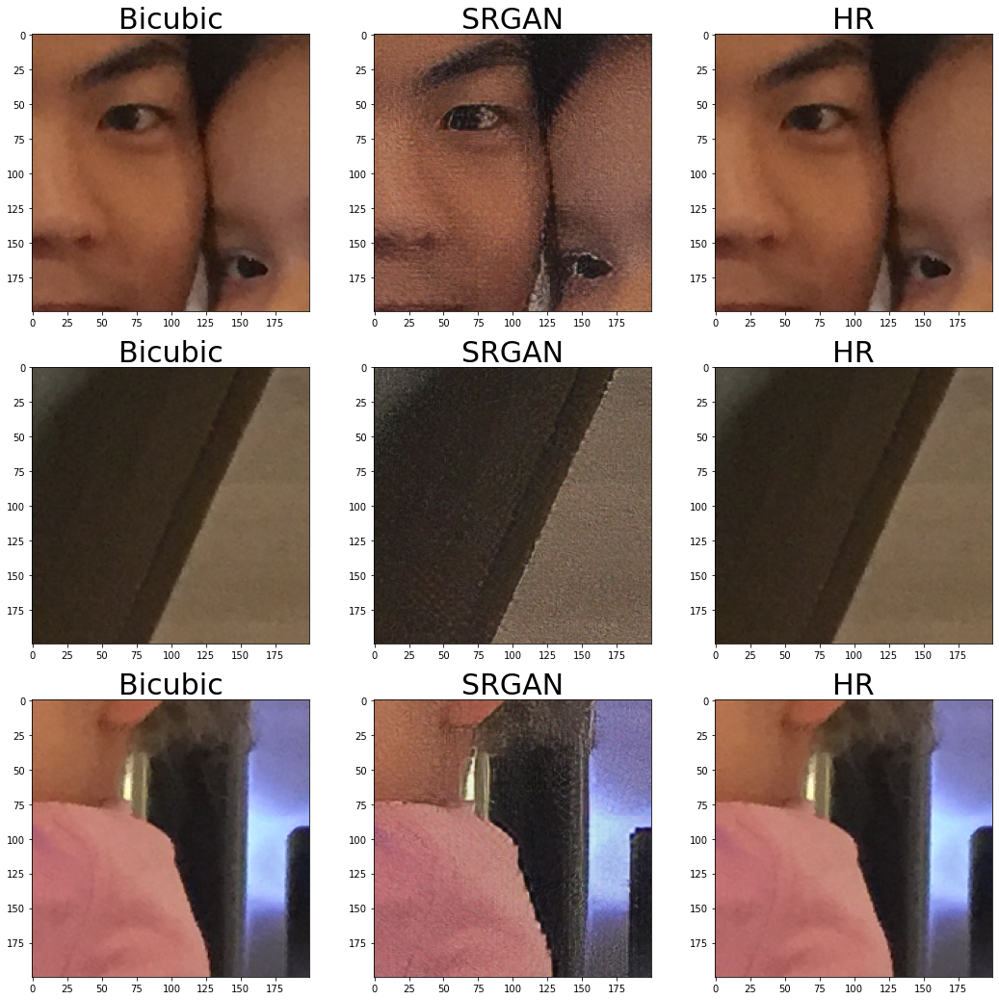

In [16]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(1000,1000), (2000,500), (1200,1300)]

images = []
for left_top in left_tops:
    img1 = crop(p1_bicubic2, left_top, 200, 200)
    img2 = crop(p1_srgan2 , left_top, 200, 200)
    img3 = crop(p1_orig2, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(cv2.cvtColor( images[i],cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)

그래서 흔들린 부분이 없는 이미지도 고해상도화 시켜봤지만 여전히 성능이 좋지않은것으로 판정되었습니다      

즉 흔들린 부분이 전체적인 모델 성능에 악영향을 줬다는 가설은 맞다고 하기 힘들것 같습니다. 



# 프로젝트 1-2 저해상도 이미지 고해상도화

### step  1: 이미지 선택
아래의 이미지를 선택하였습니다. 

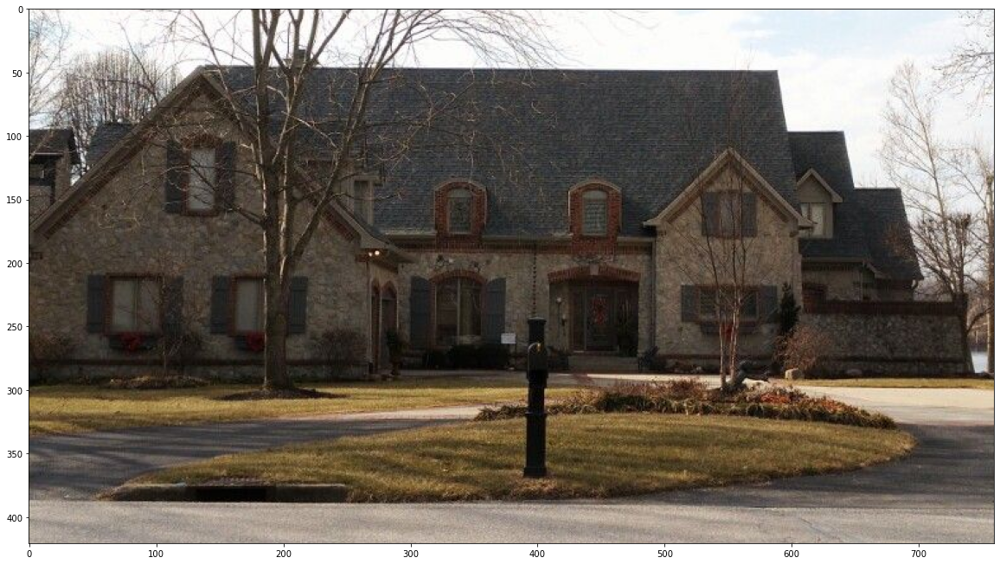

(421, 760, 3)

In [34]:
p2_path = './IMG_2300.png'  # 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요. 
p2_orig = cv2.imread(p2_path) 
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(p2_orig, cv2.COLOR_BGR2RGB))
plt.show()
p2_orig.shape

### step2 SRGAN으로 Super Resolution

In [35]:
p2_srgan = apply_srgan(p2_orig)

(1684, 3040, 3)

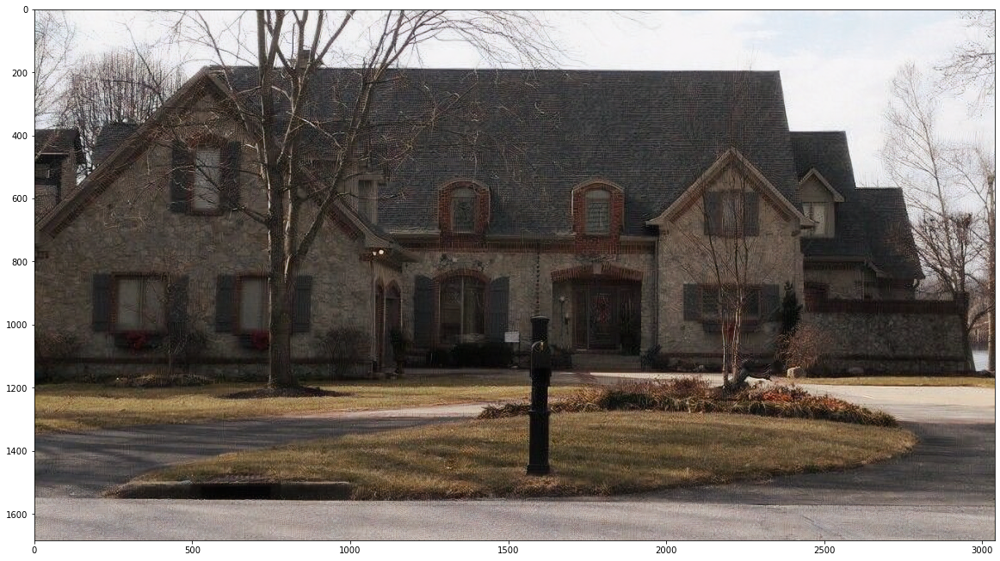

In [44]:
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(p2_srgan,cv2.COLOR_BGR2RGB) ) 
p2_srgan.shape

### step 3  bicubic interpolation으로 Super Resolution

(1684, 3040, 3)


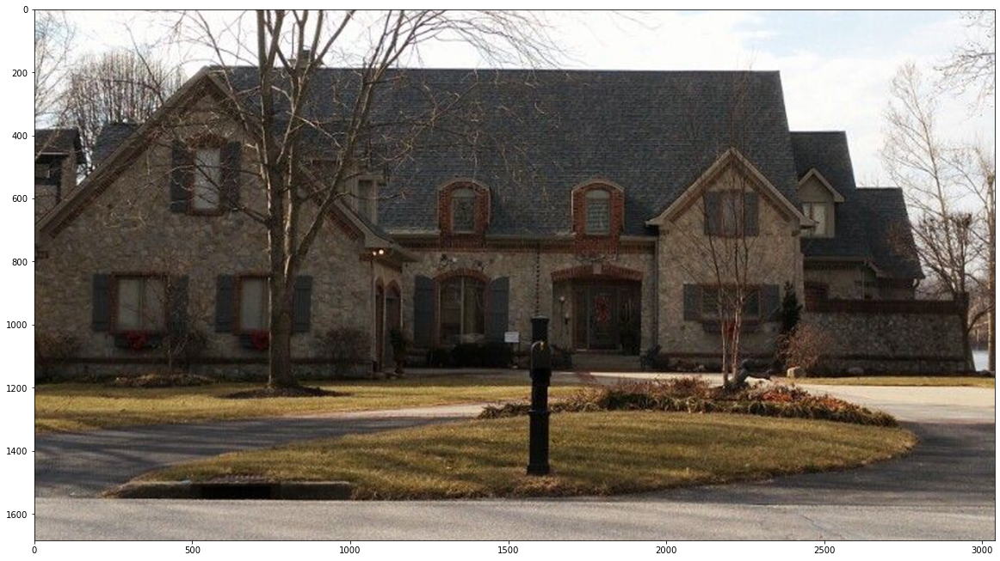

In [45]:
p2_bicubic = cv2.resize(p2_orig, dsize = (p2_orig.shape[1]*4, p2_orig.shape[0]*4), interpolation = cv2.INTER_CUBIC)
print(p2_bicubic.shape)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(p2_bicubic,cv2.COLOR_BGR2RGB ))

### step 4 2개 이미지 비교 

In [38]:
def crop(image, left_top, x = 50, y =100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1] + y), :]


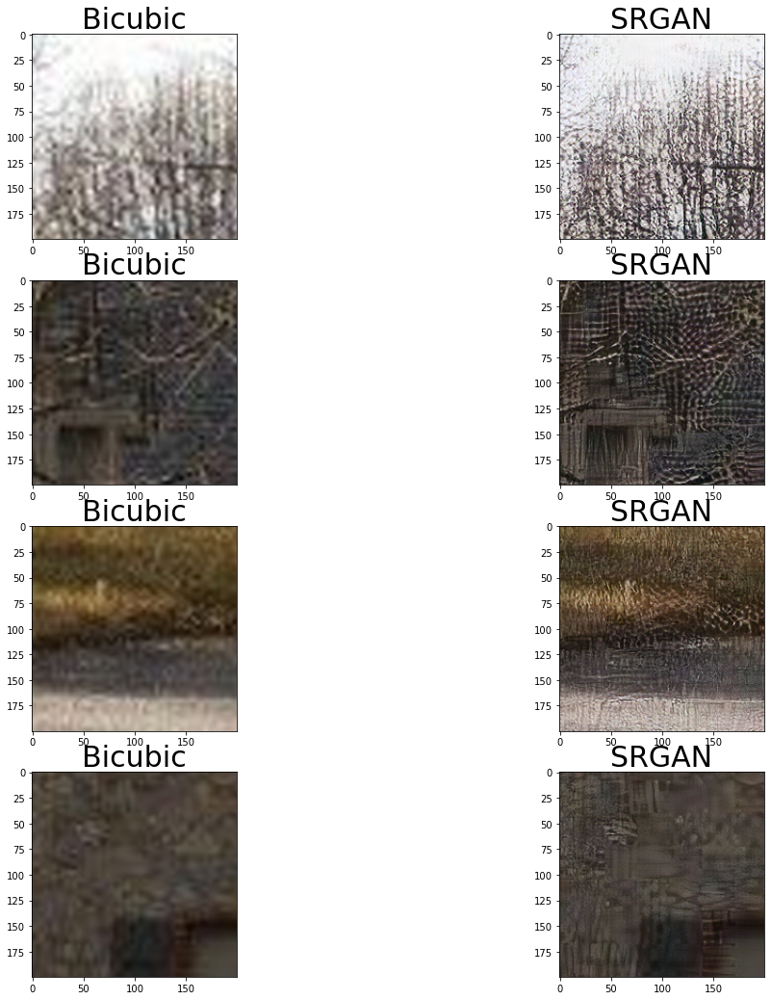

In [47]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(100,100), (400,1000), (1400,2000),(700,500)]

images = []
for left_top in left_tops:
    img1 = crop(p2_bicubic, left_top, 200, 200)
    img2 = crop(p2_srgan , left_top, 200, 200)
#     img3 = crop(p1_orig, left_top, 200, 200)
    images.extend([img1, img2])

labels = ["Bicubic", "SRGAN"] * 4

plt.figure(figsize=(18,18))
for i in range(8):
    plt.subplot(4,2,i+1) 
    plt.imshow(cv2.cvtColor( images[i],cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)


### Step5. 결과에 대한 분석 
훨씬 SRGAN이 좋음을 알수 있었습니다.              
프로젝트 1과 다르게 확실히 건물, 자연에 대해서 훨씬 더 좋은 결과를 보여줌을 알 수 있었습니다.                    
DIV2K 이미지에서 146.png, 175.png 446.png 706.png 에서 유사한 이미지가 있는데             
이것이 좋은 결과를 내는데 많은 도움을 준 것 같습니다.

# 프로젝트 2 : SRGAN을 이용해 고해상도 gif 생성하기

gif 이미지의 프레임을 하나씩 고해상도 이미지로 변환시켜 모든 프레임에 적용시키고         
그 프레임을 합쳐 동영상으로 만들어 보겠습니다.

### step1 gif 불러오기

In [54]:
metro_gif = cv2.VideoCapture("./metro_lr.gif")

isTrue = True
metro_frames = []
while isTrue:
    isTrue, metro_frame = metro_gif.read()
    if isTrue:
        metro_frame = cv2.cvtColor(metro_frame, cv2.COLOR_BGR2RGB)
        metro_frames.append(metro_frame)

print("frame 수 :", len(metro_frames))
print("frame 크기 :", (metro_frames[0].shape))

frame 수 : 35
frame 크기 : (252, 282, 3)


지하철 gif 이빈다.

In [69]:
cn_gif = cv2.VideoCapture("./city_night_lr.gif")

isTrue = True
cn_frames = []
while isTrue:
    isTrue, cn_frame = cn_gif.read()
    if isTrue:
        cn_frame = cv2.cvtColor(cn_frame, cv2.COLOR_BGR2RGB)
        cn_frames.append(cn_frame)

print("frame 수 :", len(cn_frames))
print("frame 크기 :", (cn_frames[0].shape))

frame 수 : 8
frame 크기 : (255, 500, 3)


도시 야경 gif입니다.

## step2 프레임별 Super Resolution 진행

In [56]:
# SRGAN
metro_SRGAN = []
for i in range(len(metro_frames)):
    metro_SRGAN.append(apply_srgan(metro_frames[i]))
    

In [58]:
# Bicubic
metro_BICUBIC = []
for i in range(len(metro_frames)):
    metro_BICUBIC.append(cv2.resize(metro_frames[i], dsize = (metro_frames[0].shape[1]*4, metro_frames[0].shape[0]*4), interpolation = cv2.INTER_CUBIC))

In [71]:
# SRGAN
cn_SRGAN = []
for i in range(len(cn_frames)):
    cn_SRGAN.append(apply_srgan(cn_frames[i]))
    

In [72]:
# Bicubic
# Bicubic
cn_BICUBIC = []
for i in range(len(cn_frames)):
    cn_BICUBIC.append(cv2.resize(cn_frames[i], dsize = (cn_frames[0].shape[1]*4, cn_frames[0].shape[0]*4), interpolation = cv2.INTER_CUBIC))

## step3 프레임 합치기 

In [59]:
import imageio

imageio.mimsave("metro_SRGAN_고해상도.gif",metro_SRGAN )

In [60]:
imageio.mimsave("metro_BICUBIC_고해상도.gif",metro_BICUBIC )

In [73]:
imageio.mimsave("cn_BICUBIC_고해상도.gif",cn_BICUBIC )

In [74]:
imageio.mimsave("cn_SRGAN_고해상도.gif",cn_SRGAN )

## step4 쥬피터 노트북에 gif 표시 

이미지들의 용량이 너무 커서 외부 링크로 대체하였습니다.

In [8]:
# from IPython.display import Image as show_gif

# show_gif("./metro_SRGAN_고해상도.gif", width=800) # width 는 적당히 큰 값으로 설정해주세요

<img src = "https://1.bp.blogspot.com/-COLIp0QAQHo/YEl2-ASlp5I/AAAAAAAAP70/rD1ljzLxfeUmaFZfoxrYG01YkguIPsX8wCLcBGAsYHQ/s16000/metro_BICUBIC_%25EA%25B3%25A0%25ED%2595%25B4%25EC%2583%2581%25EB%258F%2584.gif" width="800px">

위가 Bicubic, 밑이 SRGAN입니다.


<img src = "https://1.bp.blogspot.com/-47MoZtssOdA/YEl4mnAdqiI/AAAAAAAAP8I/u0GiZg8cBZYr-lSn7rVDzV9bFK_szrxBwCLcBGAsYHQ/s16000/metro_SRGAN_%25EA%25B3%25A0%25ED%2595%25B4%25EC%2583%2581%25EB%258F%2584.gif" width="800px">


SRGAN이 확연하게 더 선명한것을 확인할 수있습니다.

In [7]:
# show_gif("./metro_BICUBIC_고해상도.gif", width=800) # width 는 적당히 큰 값으로 설정해주세요

In [4]:
# show_gif("./cn_SRGAN_고해상도.gif", width=800) # width 는 적당히 큰 값으로 설정해주세요

In [5]:
# show_gif("./cn_BICUBIC_고해상도.gif", width=800) # width 는 적당히 큰 값으로 설정해주세요

<img src = "https://1.bp.blogspot.com/-ZK6QQ0lQjG4/YEl29zrEgzI/AAAAAAAAP7s/oAazm8E3RpQbLdVSj6CHPIq50aOglaiMACLcBGAsYHQ/s16000/cn_BICUBIC_%25EA%25B3%25A0%25ED%2595%25B4%25EC%2583%2581%25EB%258F%2584.gif" width="800px">


위가 BICUBIC, 밑이 SRGAN입니다. 

<img src = "https://1.bp.blogspot.com/-Z56oskoqy8E/YEl294MxF3I/AAAAAAAAP7w/cUDUxeWPItciHaHNP-TqC7rTWDbkQV58gCLcBGAsYHQ/s16000/cn_SRGAN_%25EA%25B3%25A0%25ED%2595%25B4%25EC%2583%2581%25EB%258F%2584.gif" width="800px">

SRGAN의 결과가 더 깔끔합니다. 전체적으로 어두워서 느끼기 쉽지않지만 깃발 부분, 중김 건물 부분의 디테일에서 더 깔끔함을 느낄 수 있습니다. 

# 소고

* 실용적인기술 
일단 신기하고 현실에서 매우 유용하게 쓰일수있는 기술인것 같습니다.
과거 화질이 열악한 영상들을 복구할때 쓸수있으며
조금 더 GPU 연산이나 비용이 감소한다면 미래에는 고비용,무거운 촬영장비를 들지않고
정말 휴대폰으로 편하게 찍은 (상대적) 저화질 영상을 찍은후에 Super Resolution을 활용한다면 
가볍게 찍은 영상이 무거운 전문가 장비를 쓴 영상보다 좋은 화질을 보일 수 있을 껏 같습니다. 


* 아직은 gpu 용량의 제한
GPU 용량을 많이 먹어서 kill로 gpu 용량을 먹고있는 프로세스 초기화를 해야했습니다.
그만큼 gpu 성능이 중요한것같습니다. 깃헙에 업로드할때도 용량 제한때문에 업로드하지 못할뻔했습니다. github에 25mb 제한있는줄도 몰랐음..


gpu 용량을 먹는 작업들 강제 종료법
``` terminal
nvidia-smi
sudo kill -9 (process number)
```


* 아직 모델들은 완벽하지 않고 보완할점이 남아있다.

제 이미지에는 제대로 학습이 안되서 마치 유화칠한것처럼 되기도 했습니다. 그만큼 훌륭한 모델이라고 할지라도 모든 데이터에 100% 만족할만한 성능을 주지않음으로 모델을 결정하고 모델을 보완해나가면서 명심해야할것같습니다.

* 노드 이론에 관해서 

이번 노드 설명이 너무 풍부하고 친절하다는 인상을 받았습니다.
특히 인상깊었던건 Regular Inverse Problem입니다.
철학적이라는 느낌이 들고 직관적인 문제이기때문에 소설이나 영화의 주제로 쓰여도 좋은 주제라는 느낌이 들었습니다.

* 모델평가 기준 PSNR SSIM

mse로는 부족한점이 많아 PSNR과 SSIM라는 평가기준을 새로 만들긴했는데 이 역시 부족한 점이 있는 편입니다.
이렇게 발전해나가는 점이 많은 살아있는 분야이다 보니 확실히 더 관심이 가는것 같습ㄴ디ㅏ/




더 공부하기 위해 
참고할만한 영상들

[참고 자료: PR12 - SRCNN](https://www.youtube.com/watch?v=1jGr_OFyfa0)         
[참고 자료: PR12 - SRGAN](https://www.youtube.com/watch?v=nGPMKnoJTcI)                 
[참고 자료: EDSR](https://www.youtube.com/watch?v=OMIqkn2DCUk)                      
[참고 자료: 딥러닝 Super Resolution 어디까지 왔니?](https://www.youtube.com/watch?v=nvsYKSHw0jo)                   